The codes for split it to traning, testing, validating are available at utility/mat_data.py create_WDC_dataset(). 

Run the createDCmall() function in utility/lmdb_data.py to generate training lmdb dataset. 

To generate testing files with noise, replace the srcdir and dstdir in utility/generate_case.py and run utility/generate_case.py.

In [10]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import xarray as xr
import rasterio
from rasterio.transform import from_origin
from hypso import Hypso1
from skimage import io
from osgeo import gdal
import warnings
from rasterio.errors import NotGeoreferencedWarning
import torch
import lmdb
warnings.filterwarnings("ignore", category=NotGeoreferencedWarning)

In [5]:
dir_path = '/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/'
wdc_path = '/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/WDC/'
vb_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1a.tif'
vb_T_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1a_transposed.tif'
vb_T_R_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1a_transposed_resized.tif'
vb_b_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1b.tif'
vb_b_T_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1b_transposed.tif'
vb_b_T_R_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1b_transposed_resized.tif'
dc_tif='./data/HSI_Data/Hyperspectral_Project/WDC/dc.tif'
vb_a = './data/HSI_Data/Hyperspectral_Project/HYPSO/vb_a.tif'
vb_b = './data/HSI_Data/Hyperspectral_Project/HYPSO/vb_b.tif'
case1='./data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case1/test.mat'
case2='./data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case2/test.mat'
case3='./data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case3/test.mat'
case4='./data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case4/test.mat'
case5='./data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case5/test.mat'
wdc_case1='./data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case1/test.mat'
wdc_case2='./data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case2/test.mat'
wdc_case3='./data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case3/test.mat'
wdc_case4='./data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case4/test.mat'
wdc_case5='./data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case5/test.mat'

In [ ]:
def process_hypso_images(dir_path, image_name, image_name2):
    """
    Processes HYPSO images and saves them as GeoTIFF files.

    Parameters:
    - dir_path: str, directory path where the images and points file are located.
    - image_name: str, base name of the first image file (without extension).
    - image_name2: str, base name of the second image file (without extension).
    """
    l1a_nc_file = os.path.join(dir_path, image_name + '.nc')
    points_file = os.path.join(dir_path, 'sift-bin.points')
    
    if not os.path.exists(l1a_nc_file):
        raise FileNotFoundError(f"The file {l1a_nc_file} does not exist.")
    if not os.path.exists(points_file):
        raise FileNotFoundError(f"The file {points_file} does not exist.")
    
    # Create Satellite Object
    satobj = Hypso1(path=l1a_nc_file, verbose=True)
    satobj.load_points_file(path=points_file, image_mode='standard', origin_mode='qgis')
    
    l1a_cube = satobj.get_l1a_cube()
    height, width, bands = l1a_cube.shape
    
    satobj.generate_l1b_cube()
    l1b_cube = satobj.get_l1b_cube()
    height_b, width_b, bands_b = l1b_cube.shape
    
    # Define the output GeoTIFF file paths
    output_tif = os.path.join(dir_path, image_name + '.tif')
    output_tif2 = os.path.join(dir_path, image_name2 + '.tif')
    
    # Save the first image as a GeoTIFF file
    with rasterio.open(
        output_tif,
        'w',
        driver='GTiff',
        height=height,
        width=width,
        count=bands,
        dtype='uint16',
        crs=None
    ) as dst:
        for i in range(bands):
            dst.write(l1a_cube[:, :, i], i + 1)
    
    # Save the second image as a GeoTIFF file
    with rasterio.open(
        output_tif2,
        'w',
        driver='GTiff',
        height=height_b,
        width=width_b,
        count=bands_b,
        dtype='uint16',
        crs=None
    ) as dst:
        for i in range(bands_b):
            dst.write(l1b_cube[:, :, i], i + 1)

# Example usage
process_hypso_images(dir_path, 'virginiabeach_2024-08-22T14-59-41Z-l1a', 'virginiabeach_2024-08-22T14-59-41Z-l1b')

In [ ]:
def transpose_geotiff(input_path):
    """
    Transposes a GeoTIFF image and saves the result to a new file.
    
    Parameters:
    - input_path: str, path to the input GeoTIFF file.
    """
    output_path = input_path.replace('.tif', '_transposed.tif')
    with rasterio.open(input_path) as src:
        # Read the image data
        image_data = src.read()
        print(f"Original shape: {image_data.shape}")
        
        # Transpose the image data
        transposed_data = image_data.transpose((0, 2, 1))
        
        print(f"Shape after transposing: {transposed_data.shape}")
        # Update the metadata to reflect the new dimensions
        metadata = src.meta.copy()
        metadata.update({
            'height': transposed_data.shape[1],
            'width': transposed_data.shape[2],
            'count': transposed_data.shape[0]
        })
        # Write the transposed image to a new file
        with rasterio.open(output_path, 'w', **metadata) as dst:
            dst.write(transposed_data)

transpose_geotiff(vb_b_tif)
transpose_geotiff(vb_tif)

In [53]:
def resize_geotiff(input_path, desired_bands, desired_height, desired_width, padding_value=0):
    """
    Resizes a GeoTIFF image by cropping or padding to the desired dimensions.
    
    Parameters:
    - input_path: str, path to the input GeoTIFF file.
    - desired_bands: int, desired number of bands in the output image.
    - desired_height: int, desired height of the output image.
    - desired_width: int, desired width of the output image.
    - padding_value: int, value to use for padding (default is 0).
    """
    output_path = input_path.replace('.tif', '_resized.tif')
    
    with rasterio.open(input_path) as src:
        # Read the image data
        image_data = src.read()
        original_bands, original_height, original_width = image_data.shape
        
        # Crop or pad the bands
        if desired_bands < original_bands:
            image_data = image_data[:desired_bands, :, :]
        elif desired_bands > original_bands:
            band_padding = desired_bands - original_bands
            image_data = np.pad(
                image_data,
                ((0, band_padding), (0, 0), (0, 0)),
                mode='constant',
                constant_values=padding_value
            )
        
        # Crop or pad the height and width
        if desired_height < original_height:
            image_data = image_data[:, :desired_height, :]
        elif desired_height > original_height:
            height_padding = desired_height - original_height
            image_data = np.pad(
                image_data,
                ((0, 0), (0, height_padding), (0, 0)),
                mode='constant',
                constant_values=padding_value
            )
        
        if desired_width < original_width:
            image_data = image_data[:, :, :desired_width]
        elif desired_width > original_width:
            width_padding = desired_width - original_width
            image_data = np.pad(
                image_data,
                ((0, 0), (0, 0), (0, width_padding)),
                mode='constant',
                constant_values=padding_value
            )
        
        # Update the metadata to reflect the new dimensions
        metadata = src.meta.copy()
        metadata.update({
            'count': desired_bands,
            'height': desired_height,
            'width': desired_width
        })
        
        # Write the resized image to a new file
        with rasterio.open(output_path, 'w', **metadata) as dst:
            dst.write(image_data)

# Example usage
resize_geotiff(vb_T_tif, desired_bands=191, desired_height=1280, desired_width=307, padding_value=0)
resize_geotiff(vb_b_T_tif, desired_bands=191, desired_height=1280, desired_width=307, padding_value=0)

In [ ]:
def print_geotiff_info(file_path):
    # Open the GeoTIFF file
    print("--------------------")
    print(f"FILE: {os.path.basename(file_path)}")
    
    with rasterio.open(file_path) as dataset:
        img=dataset.read()
        # print(f"Metadata: {dataset.meta}")
        print(f"raster shape:   {img.shape}")
        # print(f"raster Shape: {dataset.shape}")
        # print(f"raster width: {dataset.width}")
        # print(f"raster height: {dataset.height}")
        # print(f"raster count: {dataset.count}")
    
    dataset = gdal.Open(file_path)
    array = dataset.ReadAsArray()
    print(f"gdal shape:     {array.shape}")
    
    ioimage = io.imread(file_path, plugin='tifffile')
    print(f"skimage shape:  {ioimage.shape}") 


print_geotiff_info(vb_b_tif)
print_geotiff_info(vb_b_T_tif)
print_geotiff_info(vb_b_T_R_tif)
print_geotiff_info(dc_tif)

In [ ]:
def plot_geotiff(file_path, band_index=3):
    """
    Plots the specified band of a GeoTIFF file.
    
    Parameters:
    - file_path: str, path to the GeoTIFF file.
    - band_index: int, index of the band to plot (default is 50).
    """
    # Open the GeoTIFF file
    with rasterio.open(file_path) as src:
        # Read the specified band
        band = src.read(band_index)
        
        # Plot the band
        plt.imshow(band, cmap='Spectral')
        plt.title(f'{os.path.basename(file_path)} Band {band_index}')
        plt.axis('off')
        plt.show()
    # Plot the metadata
    metadata = src.meta
    # print("GeoTIFF Metadata:")
    # for key, value in metadata.items():
        # print(f"{key}: {value}")

# Example usage
plot_geotiff(vb_a_tif)
plot_geotiff(vb_b_tif)
plot_geotiff(vb_b_T_tif)
plot_geotiff(vb_b_T_R_tif)
plot_geotiff(dc_tif)


In [1]:
%run ./utility/mat_data.py

The shape of imggt is: (120, 1092, 598)


In [2]:
%run  ./utility/lmdb_data.py

create HYPSO...
Map size(GB): 0.15870451927185059
loading mat: train_0.mat
-------------------
Preprocessing data...
Preprocess data shape: (120, 600, 398)
zooming to 1.000000
zooming to 0.500000
zooming to 0.250000
new data 0 shape  (714, 120, 64, 64)
new data 1 shape  (510, 120, 64, 64)
new data 2 shape  (55, 120, 64, 64)
concatenating data...
new data shape after conc: (1279, 120, 64, 64)
augmenting data...
Postprocess data shape: (1279, 120, 64, 64)
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/hypso.db
load mat: train_0.mat
-------------------
Preprocessing data...
Preprocess data shape: (120, 600, 398)
zooming to 1.000000
zooming to 0.500000
zooming to 0.250000
new data 0 shape  (714, 120, 64, 64)
new data 1 shape  (510, 120, 64, 64)
new data 2 shape  (55, 120, 64, 64)
concatenating data...
new data shape after conc: (1279, 120, 64, 64)
augmenting data...
Postprocess data shape: (1279, 120, 64, 64)
load mat: train_1.mat
---------------

In [3]:
%run  ./utility/generate_case.py

1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test_noise/Cases/Case1 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test/test.mat
1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test_noise/Cases/Case2 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test/test.mat
1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test_noise/Cases/Case3 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test/test.mat
1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test_noise/Cases/Case4 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test/test.mat
1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/test_noise/Cases/Case5 

In [11]:
def plot_rgb_composite(path, keys, red_band=60, green_band=30, blue_band=10):
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 3D arrays using the provided keys
    rgb_images = []
    for key in keys:
        array = data[key]
        if key == 'data' or key == 'gt' or key == 'input':
            red = array[red_band, :, :]
            green = array[green_band, :, :]
            blue = array[blue_band, :, :]
        else:
            red = array[:, :, red_band]
            green = array[:, :, green_band]
            blue = array[:, :, blue_band]
        rgb_image = np.stack((red, green, blue), axis=-1)
        rgb_images.append(rgb_image)
    
    # Plot the images side by side
    if len(rgb_images) == 1:
        plt.imshow(rgb_images[0])
        plt.title(f'{keys[0]}')
        plt.axis('off')
    else:
        fig, axes = plt.subplots(1, len(rgb_images), figsize=(15, 5))
        for ax, rgb_image, key in zip(axes, rgb_images, keys):
            ax.imshow(rgb_image)
            ax.set_title(f'{key}')
            ax.axis('off')
    
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3015090534253069..2.058678391758985].


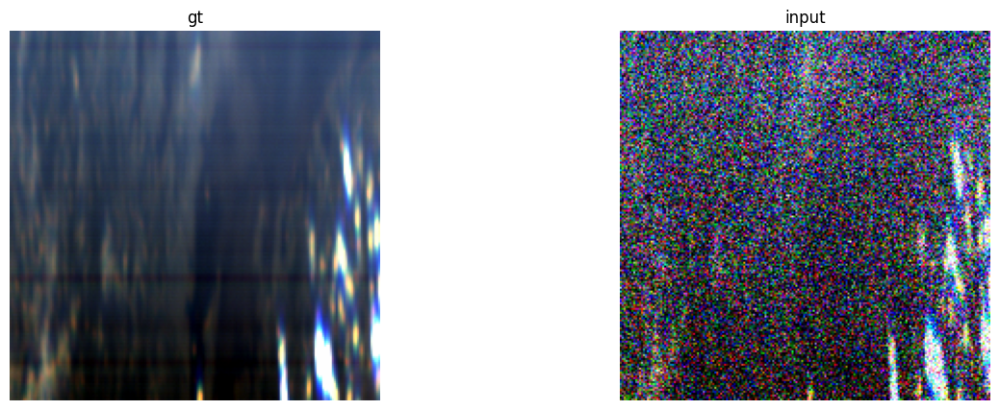

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9332507395475182..1.87164193604767].


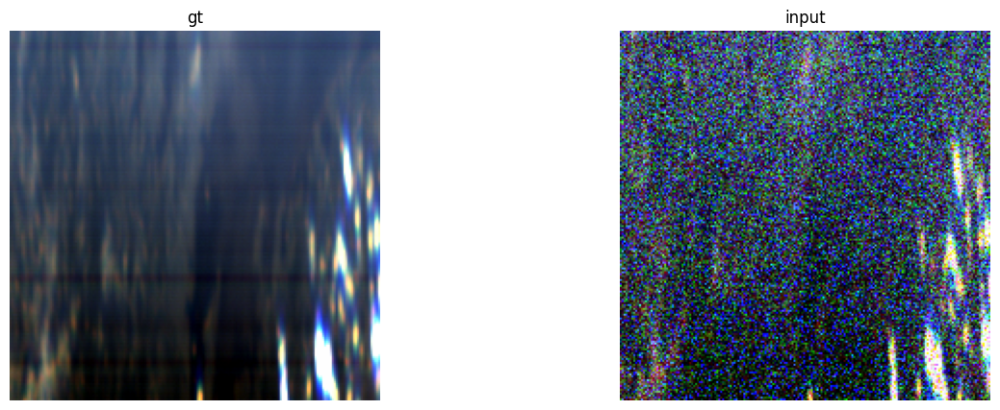

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4304373654787768..2.234999164390635].


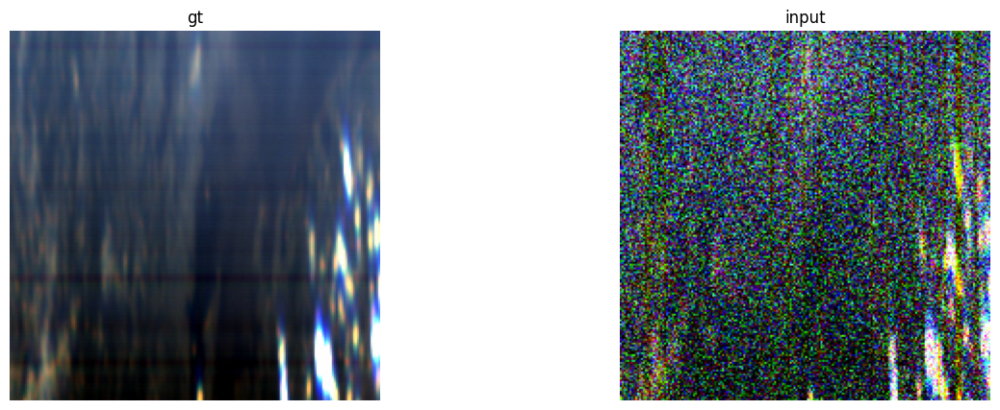

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.84055524316209..1.8352574215549704].


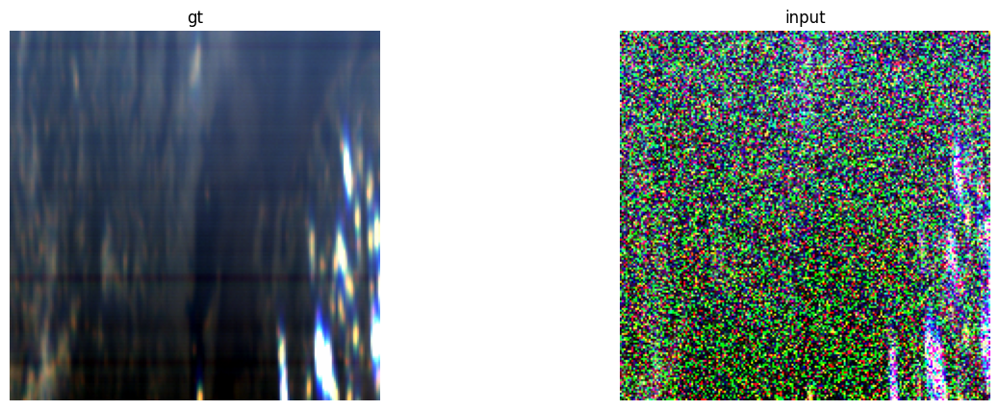

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3502008632551976..2.1198698424311617].


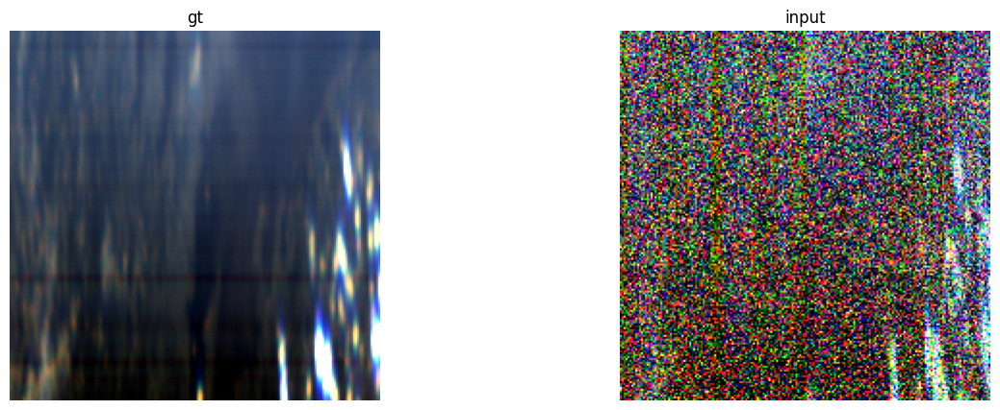

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0443545920131245..1.9809212496395927].


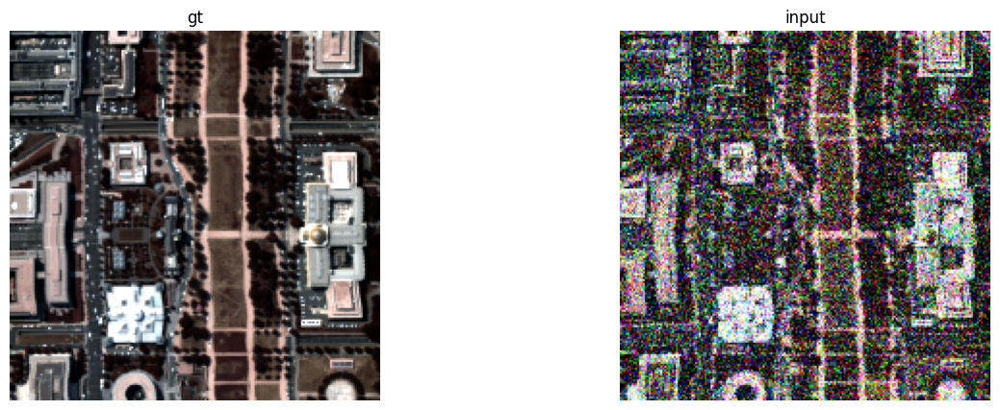

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3754329644544956..2.2118700281481676].


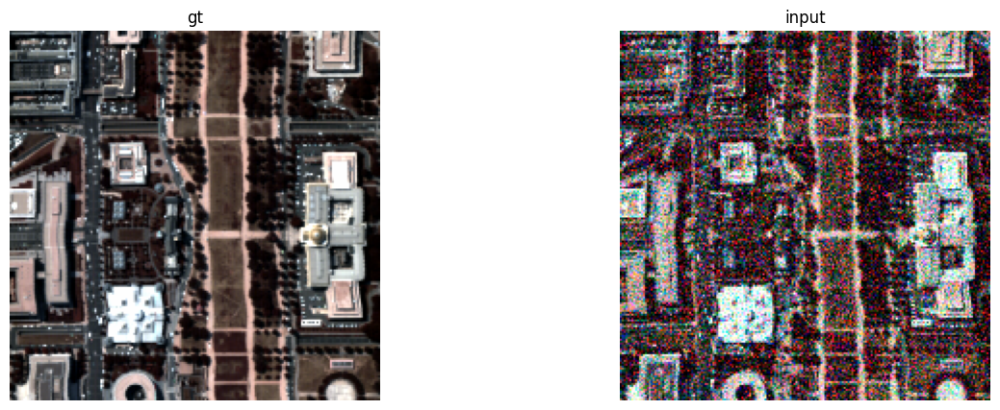

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6852670587522874..1.6641799614788186].


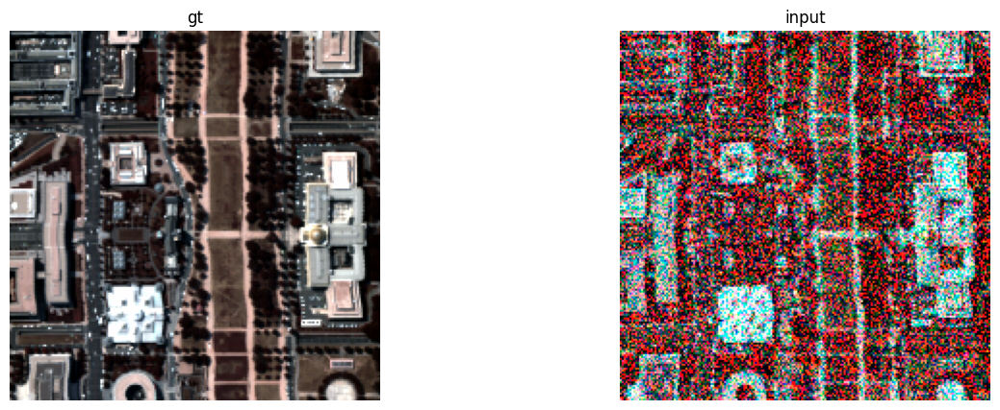

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3295655545784582..2.040834800500862].


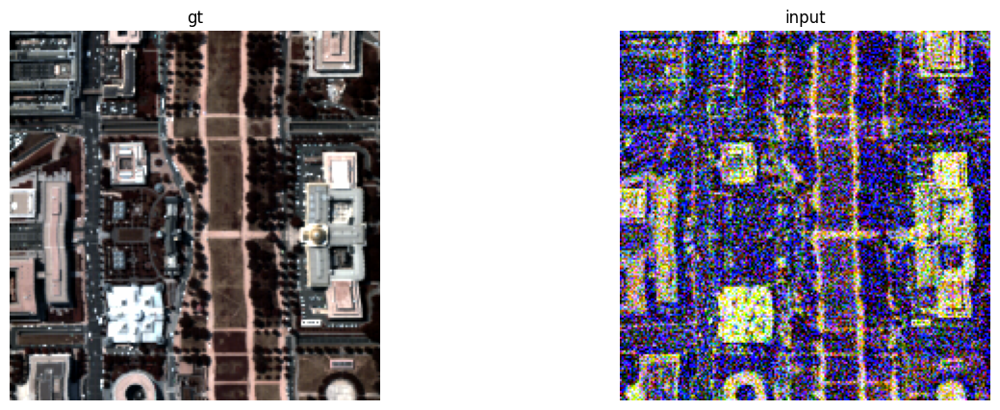

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2258197470647691..2.170223136653195].


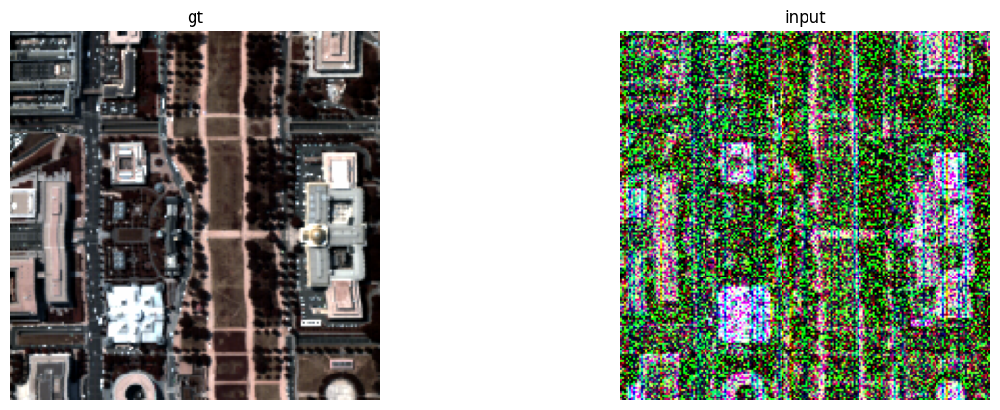

In [12]:
plot_rgb_composite(
    case1,
    keys=['gt','input'],
     red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    case2,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    case3,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    case4,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    case5,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    wdc_case1,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    wdc_case2,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    wdc_case3,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    wdc_case4,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    wdc_case5,
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.204827904701233..2.328216791152954].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13894705474376678..1.1239591836929321].


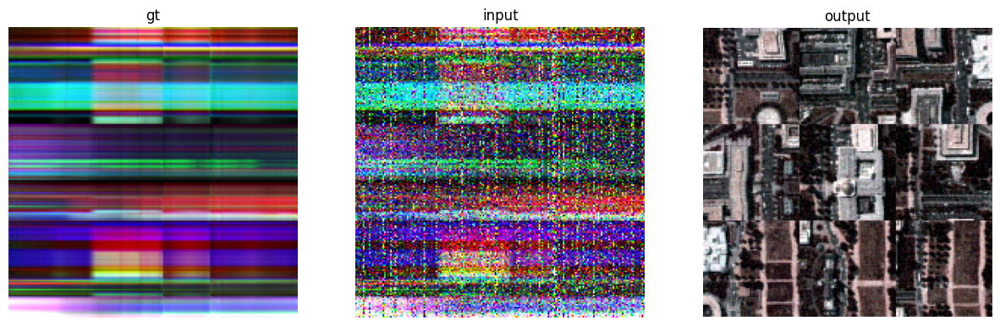

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6038143634796143..2.240363121032715].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14515969157218933..1.1071648597717285].


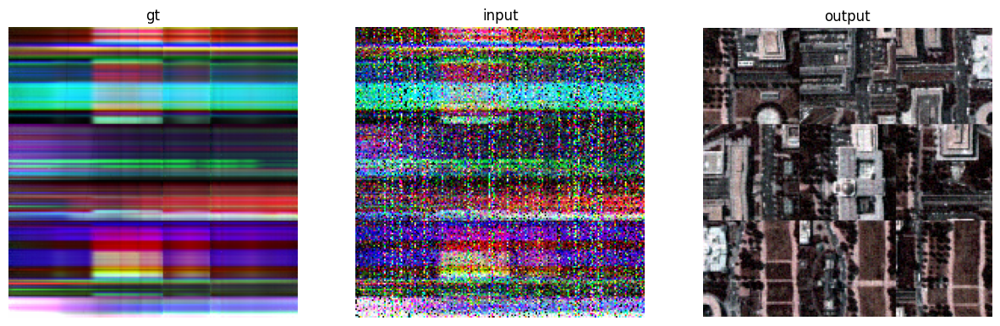

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2438807487487793..2.08628249168396].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1464952528476715..1.135345697402954].


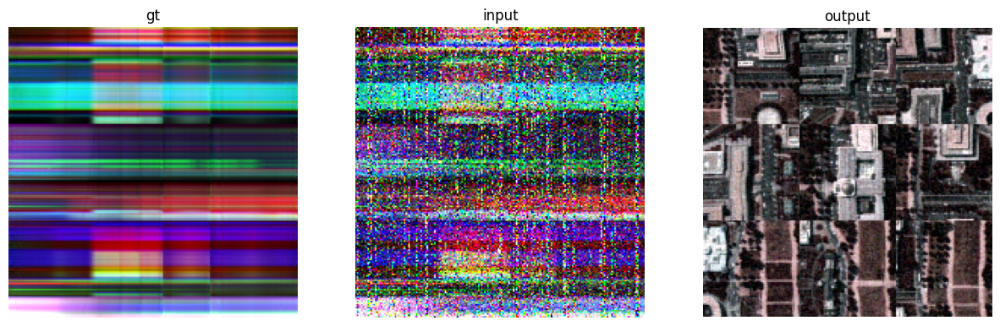

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3212032318115234..2.1083695888519287].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11813962459564209..1.1199982166290283].


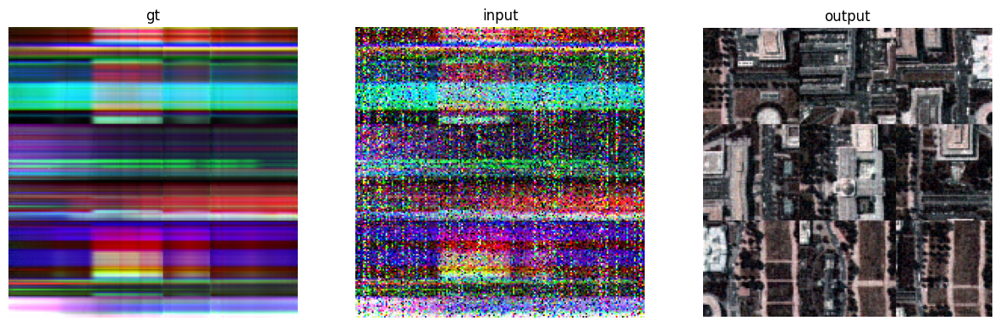

In [10]:
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case2.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case3.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case4.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case5.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)

In [22]:
def plot_hyperspectral_output(path, num_rows=3, num_cols=4, cmap='plasma'):
    """
    - Common colormaps include: 'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'gray', 'hot', 'cool', 'spring', 'summer', 'autumn', 'winter'.
    """
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 'output' key
    output_data = data['output']
    
    # Plot the output data for 12 bands with equal spacing
    num_bands = output_data.shape[2]
    num_plots = num_rows * num_cols
    spacing = num_bands // num_plots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    
    for i, ax in enumerate(axes.flat):
        band_index = i * spacing
        if band_index < num_bands:
            ax.imshow(output_data[:, :, band_index], cmap=cmap)
            ax.set_title(f'Output of {path.split("/")[-1]} - Band {band_index}')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

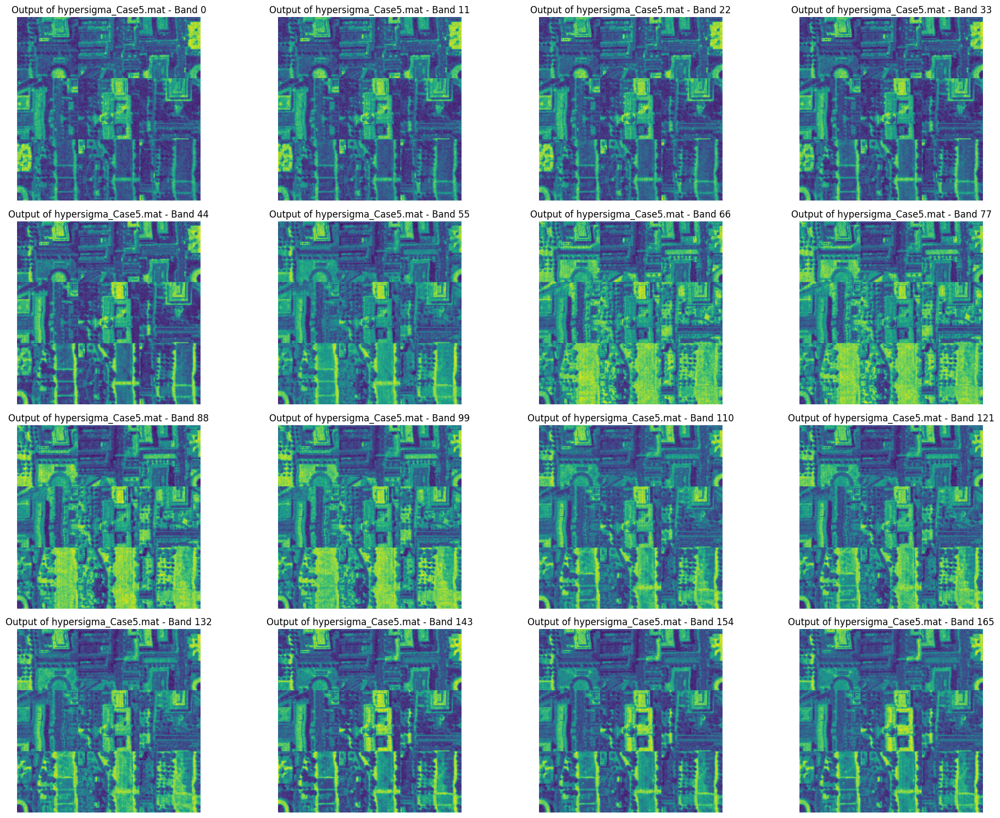

In [27]:
# Example usage
plot_hyperspectral_output(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case5.mat',
    num_rows=4, num_cols=4, cmap='viridis'
)

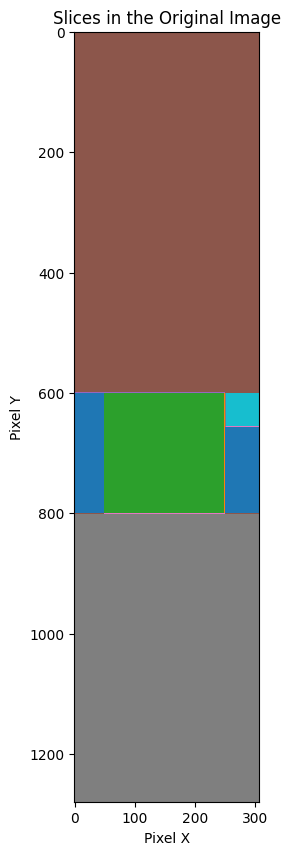

In [72]:
imggt= torch.ones(191, 1280, 307)
test = imggt[:, 600:800, 50:250].clone()
train_0 = imggt[:, :600, :].clone()
train_1 = imggt[:, 800:, :].clone()
val = imggt[:, 600:656, 251:].clone()
# Create a base image with the same dimensions as the original image
base_image = np.zeros((imggt.shape[1], imggt.shape[2]))

# Assign different values to different slices for visualization
base_image[600:800, 50:250] = 1  # Test slice GREEN
base_image[:600, :] = 2  # Train slice 0 BROWN
base_image[800:, :] = 3  # Train slice 1 GREY
base_image[600:656, 251:] = 4  # Validation slice LIGHT BLUE

# Plot the base image with different colors for each slice
plt.figure(figsize=(10, 10))
plt.imshow(base_image, cmap='tab10')
plt.title('Slices in the Original Image')
plt.axis('on')
plt.xlabel('Pixel X')
plt.ylabel('Pixel Y')

# Create a custom legend
import matplotlib.patches as mpatches
legend_labels = ['Background', 'Test Slice', 'Train Slice 0', 'Train Slice 1', 'Validation Slice']
colors = [plt.cm.tab10(i) for i in range(len(legend_labels))]
patches = [mpatches.Patch(color=colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
# plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

# plt.colorbar(ticks=[0, 1, 2, 3, 4], label='Slices')
plt.show()

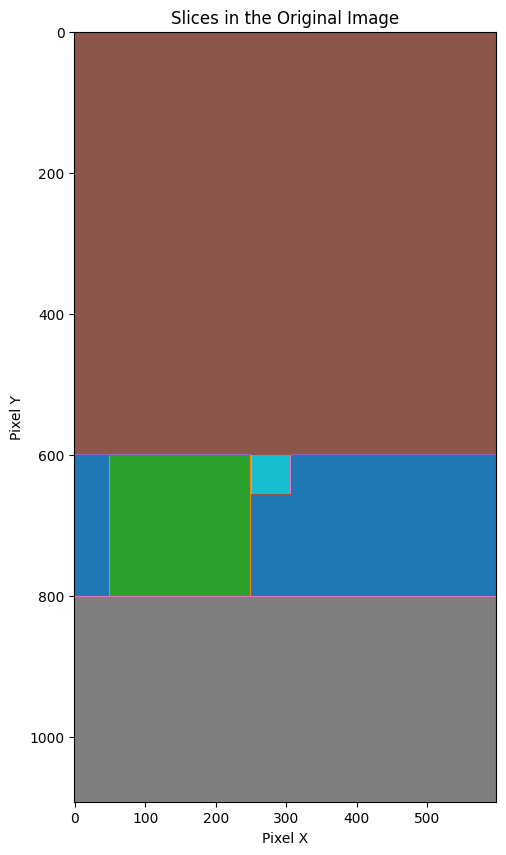

In [22]:
imggt= torch.ones(120, 1092, 598)
test = imggt[:, 600:800, 50:250].clone()
train_0 = imggt[:, :600, :].clone()
train_1 = imggt[:, 800:, :].clone()
val = imggt[:, 600:656, 251:307].clone()
# Create a base image with the same dimensions as the original image
base_image = np.zeros((imggt.shape[1], imggt.shape[2]))

# Assign different values to different slices for visualization
base_image[600:800, 50:250] = 1  # Test slice GREEN
base_image[:600, :] = 2  # Train slice 0 BROWN
base_image[800:, :] = 3  # Train slice 1 GREY
base_image[600:656, 251:307] = 4  # Validation slice LIGHT BLUE

# Plot the base image with different colors for each slice
plt.figure(figsize=(10, 10))
plt.imshow(base_image, cmap='tab10')
plt.title('Slices in the Original Image')
plt.axis('on')
plt.xlabel('Pixel X')
plt.ylabel('Pixel Y')

# Create a custom legend
import matplotlib.patches as mpatches
legend_labels = ['Background', 'Test Slice', 'Train Slice 0', 'Train Slice 1', 'Validation Slice']
colors = [plt.cm.tab10(i) for i in range(len(legend_labels))]
patches = [mpatches.Patch(color=colors[i], label=legend_labels[i]) for i in range(len(legend_labels))]
# plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

# plt.colorbar(ticks=[0, 1, 2, 3, 4], label='Slices')
plt.show()

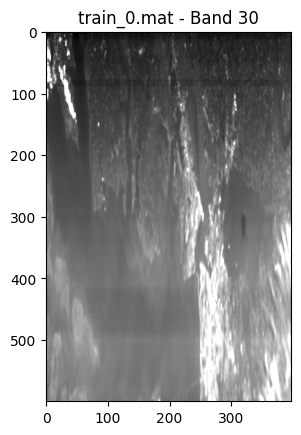

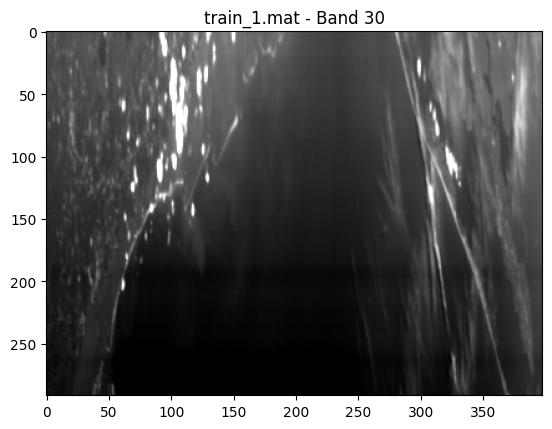

In [13]:
def plot_mat_band(file_path, band_index):
    """
    Plots a specific band from a .mat file.

    Parameters:
    - file_path: str, path to the .mat file.
    - band_index: int, index of the band to plot.
    """
    # Load the .mat file
    data = scipy.io.loadmat(file_path)
    
    # Extract the 'data' key (assuming the hyperspectral data is stored under the 'data' key)
    if 'data' not in data:
        raise KeyError(f"The key 'data' was not found in the .mat file: {file_path}")
    
    hyperspectral_data = data['data']
    
    # Check if the band index is within the valid range
    if band_index < 0 or band_index >= hyperspectral_data.shape[0]:
        raise IndexError(f"Band index {band_index} is out of range for the data with {hyperspectral_data.shape[0]} bands.")
    
    # Extract the specified band
    band = hyperspectral_data[band_index, :, :]
    
    # Plot the band
    plt.imshow(band, cmap='gray')
    plt.title(f'{os.path.basename(file_path)} - Band {band_index}')
    plt.axis('on')
    plt.show()

# Example usage
plot_mat_band('/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/train/train_0.mat', 30)
plot_mat_band('/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/train/train_1.mat', 30)